# Рынок заведений общественного питания Москвы

**Цель исследования**
Подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных**
Файл moscow_places.csv:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
seats — количество посадочных мест.

**План работы**

- Шаг 1. Загрузка данных и изучение общей информации
- Шаг 2. Предобработка данных
- Шаг 3. Анализ данных
- Шаг 4. Детализация исследование: открытие кофейни
- Шаг 5. Подготовка презентации

In [1]:
# импорт библиотек

import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go 
import plotly.io as pio
import matplotlib.pyplot as plt
import warnings
import folium
import re
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
warnings.filterwarnings("ignore")

## Загрузка данных и общая информация

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1234,Sport Bar,кафе,"Москва, Волоколамское шоссе, 69",Северо-Западный административный округ,NaN,55.817820,37.439194,4.2,NaN,NaN,NaN,NaN,0,180.0
7860,У маслория,кафе,"Москва, улица Бехтерева, 45, корп. 1",Южный административный округ,"ежедневно, 09:00–19:00",55.616681,37.648394,4.8,NaN,NaN,NaN,NaN,0,NaN
3825,Моремания,ресторан,"Москва, Страстной бульвар, 8А",Центральный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.766429,37.610585,4.4,NaN,NaN,NaN,NaN,1,100.0
990,Чайхона Лаззат,кафе,"Москва, проезд Русанова, 17",Северо-Восточный административный округ,"ежедневно, 08:00–00:00",55.856163,37.643836,4.3,NaN,NaN,NaN,NaN,0,48.0
3695,Чайхона Айва,кафе,"Москва, Страстной бульвар, 4с4",Центральный административный округ,"ежедневно, круглосуточно",55.764917,37.607806,4.4,NaN,NaN,NaN,NaN,1,NaN


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Большая часть колонок представляет собой объекты категориального характера, типы колонок верные.

## Предобработка данных

In [5]:
data.shape[0]

8406

In [6]:
# проверка на дубликаты
data.duplicated().sum()


0

In [7]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [8]:
# проверка на дубликаты по сочетанию названия и адреса
duplicateRows = data[data.duplicated(['name', 'address'])]
sum_duplicated = data.duplicated(['name', 'address']).sum()
print(sum_duplicated)

4


In [9]:
# 
data = data.drop_duplicates(subset=['name', 'address'])
data.shape[0]

8402

In [10]:
# посмотрим на число пропусков

numbers_of_nulls = pd.DataFrame(columns=['names'], data=data.columns)
numbers_of_nulls['nulls'] = data.isnull().sum().values
numbers_of_nulls['nulls_percent'] = round(100*numbers_of_nulls['nulls']/data.shape[0])
numbers_of_nulls

,names,nulls,nulls_percent
0,name,0,0.0
1,category,0,0.0
2,address,0,0.0
3,district,0,0.0
4,hours,535,6.0
5,lat,0,0.0
6,lng,0,0.0
7,rating,0,0.0
8,price,5087,61.0
9,avg_bill,4586,55.0


Оставляем пропуски, анализировать будем только доступную информацию.

In [11]:
# добавим в отдельный столбец название улицы
data['street'] = [re.split('\,', x)[1] for x in data['address']]
data['street'] = data['street'].str.lstrip()

In [12]:
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
3471,каретный двор,"бар,паб","москва, поварская улица, 52/55с3",Центральный административный округ,"ежедневно, 11:00–23:00",55.757884,37.585823,4.4,высокие,Средний счёт:1500–2500 ₽,2000.0,NaN,0,NaN,поварская улица
6018,vasilchukí chaihona №1,ресторан,"москва, улица дмитрия ульянова, 51",Юго-Западный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–02:00; вс 11:00...",55.680554,37.595679,4.3,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,1,100.0,улица дмитрия ульянова
7631,senza titolo,пиццерия,"москва, варшавское шоссе, 141к11",Южный административный округ,"ежедневно, 11:00–23:00",55.588092,37.601319,4.3,средние,Средний счёт:500–1500 ₽,1000.0,NaN,0,NaN,варшавское шоссе
1800,promenade lounge,кафе,"москва, ленинградский проспект, 36, стр. 33",Северный административный округ,"ежедневно, круглосуточно",55.787416,37.566735,4.4,высокие,Средний счёт:3000–4000 ₽,3500.0,NaN,0,90.0,ленинградский проспект
6097,креветочная,быстрое питание,"москва, улица вавилова, 3",Южный административный округ,"ежедневно, 09:00–22:00",55.706883,37.592096,4.2,NaN,NaN,NaN,NaN,0,320.0,улица вавилова


In [13]:
# добавим отдельный фильтр по заведениям формата 24/7
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
5435,cofix,кофейня,"москва, шоссе энтузиастов, 31",Восточный административный округ,"пн-пт 07:00–23:00; сб,вс 08:00–22:00",55.758740,37.751553,4.2,NaN,NaN,NaN,NaN,1,70.0,шоссе энтузиастов,False
2622,coffee in,кофейня,"москва, 3-я парковая улица, 26/2",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 09:00–21:00",55.795649,37.782803,4.4,NaN,NaN,NaN,NaN,1,0.0,3-я парковая улица,False
557,луна,кафе,"москва, михалковская улица, 38, стр. 6",Северный административный округ,"ежедневно, 11:00–03:00",55.841261,37.518073,3.2,средние,Средний счёт:500 ₽,500.0,NaN,1,40.0,михалковская улица,False
1576,кафе - кулинария два гуся,ресторан,"москва, балтийская улица, 14",Северный административный округ,пн-пт 09:00–17:00,55.812676,37.518003,4.0,NaN,NaN,NaN,NaN,0,NaN,балтийская улица,False
7197,домашнее,быстрое питание,"москва, каширское шоссе, 25б",Южный административный округ,"ежедневно, 08:00–20:00",55.656153,37.647882,4.4,NaN,NaN,NaN,NaN,0,24.0,каширское шоссе,False


## Анализ данных

### Распределении заведений разных категорий

In [15]:
# передаем функции аргументы: данные, столбец, заголовок и подписи осей
def display_countplot(data, column, title, ylabel, xlabel):     
    # размер графика
    plt.figure(figsize=(18, 8))
    # переменная, которая будет окрашивать наши столбцы в разные цвета
    palette = sns.color_palette('Blues', data[column].nunique()) 
    # разворачиваем цвета в палитре.
    # Иначе в некоторых случаях цвета графика и цвета на карте вводят в заблуждение
    palette.reverse() 
    # строим фигуру, расположив столбцы в порядке убывания
    ax = sns.countplot(x=column, data=data, order = data[column].value_counts().index, palette=palette)
    # разворачиваем название столбцов и задаем шрифт
    plt.xticks(rotation=45, fontsize=16)
    # задаем шрифт по оси y
    plt.yticks(fontsize=16)
    # подписи ко всем осям и самому графику
    ax.set_title(title, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=18)

    # цикл для отображения значений на каждом столбце
    for i in ax.patches:
        _x = i.get_x() + i.get_width() / 2
        _y = i.get_y() + i.get_height() + (i.get_height()*0.02)
        value = '{:.1f}'.format(i.get_height())
        ax.text(_x, _y, value, ha="center")
        

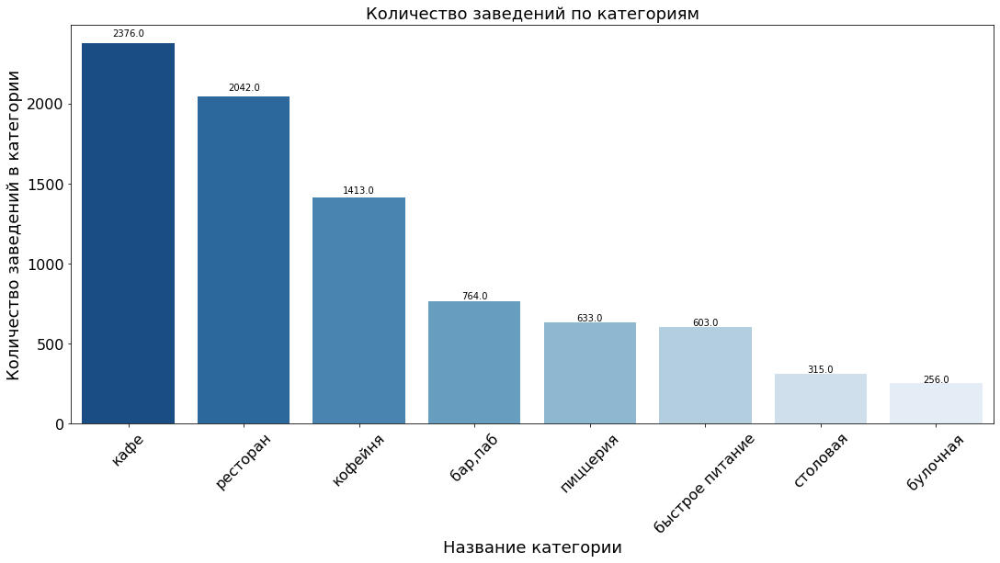

In [16]:
display_countplot(data, 'category',\
                 'Количество заведений по категориям',\
                 'Количество заведений в категории',\
                 'Название категории')

**Вывод:** Наиболее популярные категории заведений - это кафе, рестораны и кофейни. Далее категории имеют уже меньше 1000 единиц.

### Количество посадочных мест в зависимости от категории заведения

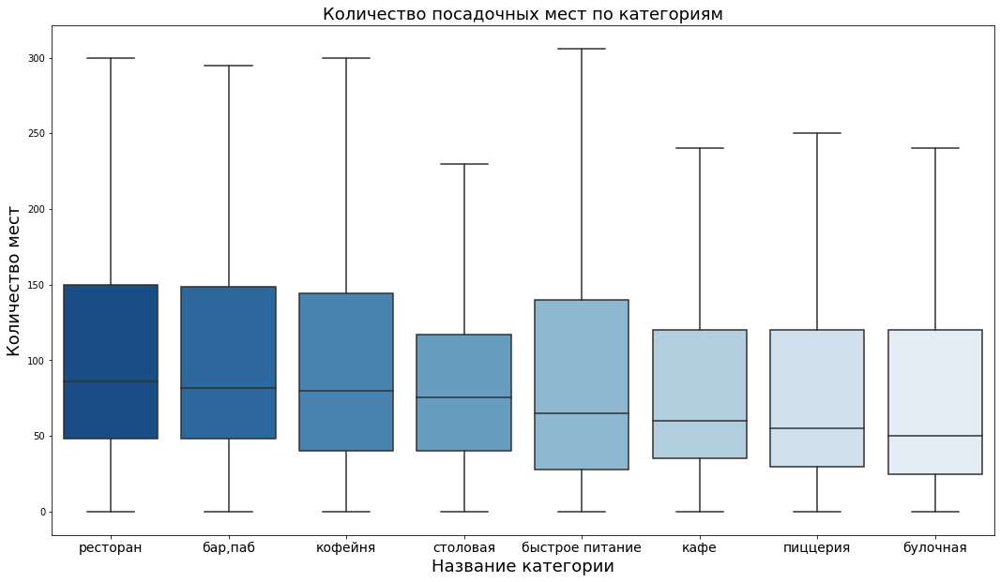

In [17]:
plt.figure(figsize=(18, 10))
palette = sns.color_palette('Blues', data['category'].nunique())
palette.reverse()
box_order = data.groupby('category')['seats'].median().sort_values(ascending=False).index 
ax = sns.boxplot(x='category', y='seats', data=data, order=box_order, palette=palette, showfliers=False) 
ax.set_ylabel('Количество мест', fontsize=18)
ax.set_xlabel('Название категории', fontsize=18)
plt.xticks(fontsize=14)
ax.set_title('Количество посадочных мест по категориям', fontsize=18);

In [18]:
data.groupby('category')['seats'].median().sort_values(ascending=False)


category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

**Вывод:** Медианое значение числа мест в ресторанах, барах и кофейнях около 80, кафе, пиццерии и булочные имеют уже меньшее число мест - от 50 до 60.

### Соотношение сетевых и несетевых заведений

In [19]:
chain_ratio = data.groupby('chain', as_index=False)['chain'].count()
chain_ratio = chain_ratio.reset_index()
chain_ratio.columns = ['Тип заведения', 'Количество']
chain_ratio['Тип заведения'] = chain_ratio['Тип заведения'].apply(lambda x: 'несетевое' if x == 0 else 'сетевое')
chain_ratio

,Тип заведения,Количество
0,несетевое,5199
1,сетевое,3203


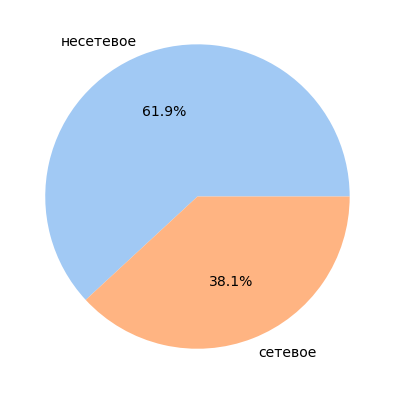

In [20]:
plt.figure(figsize=(7, 7))
y = chain_ratio['Количество']
mylabels = chain_ratio['Тип заведения']

colors = sns.color_palette('pastel')[ 0:5 ]
plt.pie(y, labels = mylabels,  autopct='%1.1f%%', colors = colors,  textprops={'fontsize': 14})

plt.show() 

**Вывод:** Несетевых заведений больше, а именно 61,9%.

### Категории заведений, которые чаще являются сетевыми

In [21]:
df = data[['category','chain']]
df['chain'] = df['chain'].apply(lambda x: 'несетевое' if x == 0 else 'сетевое')
df_g = df.groupby(['category', 'chain']).size().sort_values(ascending=False).reset_index()
df_g['percentage'] = df.groupby(['category', 'chain']).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
df_g.columns = ['category', 'chain', 'Counts', 'Percentage']
fig = px.bar(df_g, x='category', y=['Counts'], color='chain',\
                             labels={
                     "value": "Количество заведений",
                     "category": "Название категории",
                     "chain": "сетевое / несетевое",
                     },
             title="Отношение сетевых к несетевым заведениям по категориям")
fig.update_traces(textfont_size=20, textangle=0)

fig.show()

Кафе, рестораны, бары и столовые чаще других категорий являются несетевыми заведениями – половина и более этих категорий не принадлежат к сетям.

### Топ-15 популярных сетей в Москве

In [22]:
# для начала приведем заведения к нижнему регистру
data['name'] = data['name'].str.lower().str.replace('.', ' ')
data.name.nunique()

5511

In [23]:
# определим топ-15 сетей
top_15 = data[data['chain'] == 1]['name'].value_counts().head(15)
top_15

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
яндекс лавка                            72
one price coffee                        71
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: name, dtype: int64

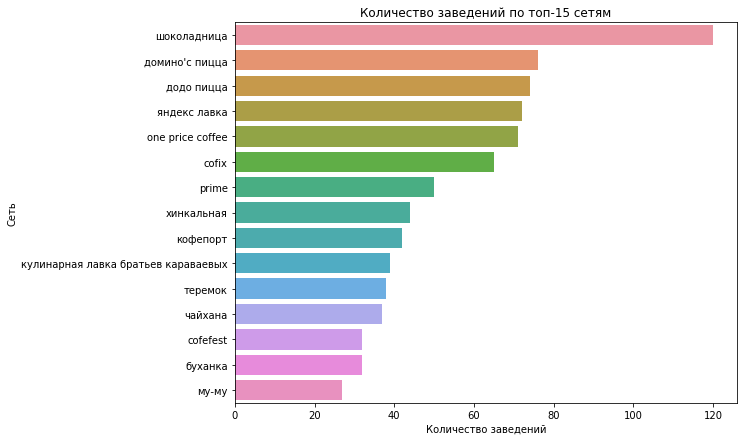

In [24]:
y = top_15.index
x = top_15

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=top_15.reset_index())

plt.title('Количество заведений по топ-15 сетям')
plt.xlabel('Количество заведений')
plt.ylabel('Сеть')

plt.show()

In [25]:
top_15 = data.query('chain == 1').groupby(['name', 'category'])['name'].count().sort_values(ascending=False).to_frame().head(15)
top_15.columns = ['count']
top_15 = top_15.reset_index(level=0).reset_index(level=0).sort_values(by='category')
top_15

,category,name,count
12,булочная,буханка,25
8,кафе,кулинарная лавка братьев караваевых,39
11,кафе,чайхана,26
13,кафе,drive café,24
0,кофейня,шоколадница,119
4,кофейня,one price coffee,71
5,кофейня,cofix,65
7,кофейня,кофепорт,42
10,кофейня,cofefest,31
14,кофейня,кофемания,22


In [26]:
top_15_category = top_15.groupby('category')['count'].sum().to_frame().reset_index(level=0)
top_15_category

,category,count
0,булочная,25
1,кафе,89
2,кофейня,350
3,пиццерия,150
4,ресторан,157


In [27]:
top_15 = data.query('chain == 1').pivot_table(index=['category', 'name'], values='chain', aggfunc='count')\
.reset_index().sort_values(by='chain', ascending=False).head(15) 

In [28]:
fig = px.bar(top_15, x='category', y='chain', color='name', title="ТОП-15 сетевых заведений по категориям", text='chain', labels={
                     "name": "Заведение",
                     "category": "Название категории",
                     "chain": "Количество",
                     })
fig.update_layout(xaxis = {'categoryorder': 'total descending'})
fig.show()

**Вывод:** Самая крупная сеть - известная Шоколадница. Следует отметить присутствие сразу 2-х пиццерий в топ-3,  6-ти кофеен в топ-15 и Яндекс.Лавки в топ-5.

### Общее количество заведений и количество заведений каждой категории по районам

In [29]:
data['district'].unique()


array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [30]:
district_short = {
    'Северный административный округ': 'Северный',
    'Северо-Западный административный округ': 'Северо-Западный',
    'Западный административный округ': 'Западный',
    'Восточный административный округ': 'Восточный',
    'Юго-Западный административный округ': 'Юго-Западный',
    'Южный административный округ': 'Южный',
    'Юго-Восточный административный округ': 'Юго-Восточный',
    'Центральный административный округ': 'Центральный',
    'Северо-Восточный административный округ': 'Северо-Восточный',
    'Зеленоградский административный округ': 'Зеленоградский'
}

data['district_red'] = data['district'].replace(district_short)

In [31]:
regions_category = data.groupby(['district', 'category'], as_index=False)['name'].count()\
.sort_values(by= ['district', 'name'], ascending=False)
regions_category

,district,category,name
67,Южный административный округ,кафе,264
70,Южный административный округ,ресторан,202
68,Южный административный округ,кофейня,131
66,Южный административный округ,быстрое питание,85
69,Южный административный округ,пиццерия,73
...,...,...,...
5,Восточный административный округ,пиццерия,72
2,Восточный административный округ,быстрое питание,71
0,Восточный административный округ,"бар,паб",53
7,Восточный административный округ,столовая,40


In [32]:
df = data[['district_red','category']]
df_g = df.groupby(['district_red', 'category']).size().reset_index()
df_g['percentage'] = df.groupby(['district_red','category']).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
df_g.columns = ['district_red', 'category', 'counts', 'percentage']
fig = px.bar(df_g, x='district_red', y=['counts'], color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Отношение категорий в разных административных округах',
                 xaxis_title='Название административного округа',
                 yaxis_title='Количество заведений',
                 autosize=False,
                 width=900,
                 height=550,
                 xaxis={'categoryorder':'total descending'})        
fig.update_traces(textfont_size=20, textangle=0)
fig.show()

**Вывод:** На общем фоне сильно выделяется Центральный административный округ с более чем 2000 заведений. В структура Западного, Северного и Северо-Западного округов выделяются кофейни. В остальном структуры всех округов похожи - преобладают рестораны и кафе.

### Распределение средних рейтингов по категориям заведений

In [33]:
avg_rating = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)
avg_rating.columns = ['category', 'avg_rating']
avg_rating

,category,avg_rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


In [34]:
def display_barplot(df, column_1, column_2, title, ylabel, xlabel, ylim_bott, ylim_top):
    plt.figure(figsize=(18, 8))
    palette = sns.color_palette('Blues', df[column_1].nunique())
    palette.reverse()
    ax = sns.barplot(x=df[column_1], y=df[column_2], palette=palette)
    ax.set_xlabel(xlabel, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.set_title(title, fontsize=18);
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    ax.set_ylim(ylim_bott, ylim_top)
    
    for i in ax.patches:
        _x = i.get_x() + i.get_width() / 2
        _y = i.get_y() + i.get_height() + (i.get_height()*0.01)
        value = '{:.2f}'.format(i.get_height())
        ax.text(_x, _y, value, ha="center")

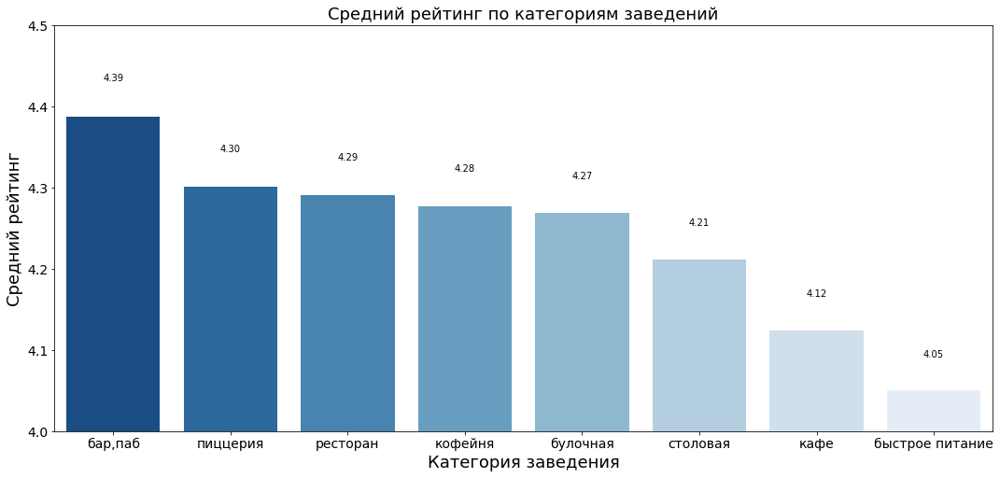

In [35]:
display_barplot(avg_rating, 'category', 'avg_rating',\
               'Средний рейтинг по категориям заведений',\
               'Средний рейтинг',\
               'Категория заведения',\
               4, 4.5)

**Вывод:** Средние рейтинги по категориям отличаются: высокие оценки получают бары и пабы, а самые низкие  ставят посетители заведений быстрого питания.

### Хороплет со средним рейтингом заведений каждого района

In [36]:
rating_df = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [37]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
        json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True)

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Все заведения датасета на карте

In [39]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [40]:
data.groupby('street')['name'].count().sort_values(ascending=False).head(15)


street
проспект мира             183
профсоюзная улица         122
проспект вернадского      108
ленинский проспект        107
ленинградский проспект     95
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           76
ленинградское шоссе        70
мкад                       65
люблинская улица           60
улица вавилова             55
кутузовский проспект       54
улица миклухо-маклая       49
пятницкая улица            48
Name: name, dtype: int64

In [41]:
top_15_streets = data[data['street'].isin(
    data.groupby('street')['name'].count()
    .sort_values(ascending=False).head(15).index)]

In [42]:
top_15_streets_and_cat = top_15_streets.groupby(['street', 'category'], as_index=False)['name'].count()
top_15_streets_and_cat.rename({'name' : 'quantity'}, axis=1, inplace=True)

In [43]:
fig = px.bar(top_15_streets_and_cat, x='street', y='quantity', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение заведений и их категорий по топ-15 улицам',
                   xaxis_title='Улица',
                   yaxis_title='Распределение',
                   autosize=False,
                   width=900,
                   height=800,
                   xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** Самое большое число заведений наблюдается на проспекте Мира. В среднем на топ-15 улицах от 50 до 100 заведений. Заметно, что на МКАД сильно приобладает категория заведений - кафе. На Лининградском проспекте больше всего баров.  По остальным улицам распределение более менее равномерное. 

Проспекты и шоссе имеют длительную протеженность и поэтому имеют наибольшее число заведений. Пятницкая - известная своими заведениями улица в центре Москвы.


### Улицы, на которых находится только один объект общепита

In [44]:
one_on_street = data.groupby('street')['name'].count() == 1
one_on_street = one_on_street[one_on_street.values == True]

In [45]:
one_on_street = data[data['street'].isin(one_on_street.index)]

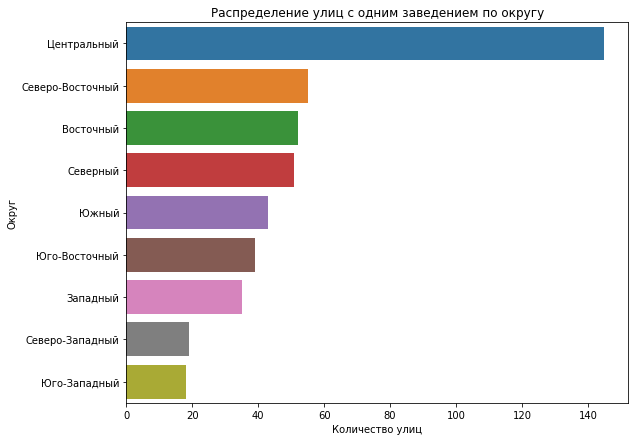

In [46]:

x = one_on_street.groupby('district_red')['street'].count().sort_values(ascending=False)
y = one_on_street.groupby('district_red')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_on_street.reset_index())

plt.title('Распределение улиц с одним заведением по округу')
plt.xlabel('Количество улиц')
plt.ylabel('Округ')

plt.show()

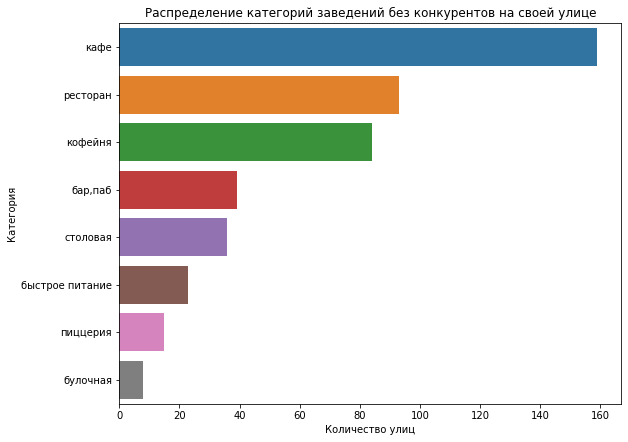

In [47]:
x = one_on_street.groupby('category')['street'].count().sort_values(ascending=False)
y = one_on_street.groupby('category')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_on_street.reset_index())

plt.title('Распределение категорий заведений без конкурентов на своей улице')
plt.xlabel('Количество улиц')
plt.ylabel('Категория')

plt.show()

**Вывод:** Больше всего улиц с одним заведением в ЦАО и чаще всего, это единственное заведение - кафе. Это связано с тем, что в центре самое большое число улиц, в том числе и небольшой протяженности, т.н. мини-улочки.

### Анализ среднего чека

In [48]:
data[data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)].groupby('district_red')[
    'middle_avg_bill'].mean().sort_values(ascending=False)

district_red
Центральный         945.118337
Западный            889.811388
Северо-Западный     775.745098
Северный            772.526490
Юго-Западный        741.236842
Восточный           708.285141
Южный               678.924837
Северо-Восточный    647.945205
Юго-Восточный       592.037037
Name: middle_avg_bill, dtype: float64

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = data[data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)].groupby('district')[
    'middle_avg_bill'].mean()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

m

In [50]:
print('Средний чек в Центральном АО по отношению к остальным округам:', round(
    data[(data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)) & (data['district'] == 'Центральный административный округ')][
    'middle_avg_bill'].mean() / 
    data[(data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)) & (data['district'] != 'Центральный административный округ')][
    'middle_avg_bill'].mean(),2))

Средний чек в Центральном АО по отношению к остальным округам: 1.3


**Вывод:** Самый высокий средний чек - в ЦАО и ЗАО. Самый низкий средний чек в ЮАО, СВАО и ЮВАО. В среднем чек в ЦАО на 30% выше, чем в остальных округах.

### Общий вывод

- Наиболее популярные категории заведений - это кафе, рестораны и кофейни. Далее категории имеют уже меньше 1000 заведений в Москве.

- Медианое значение числа мест в ресторанах, барах и кофейнях около 80, кафе, пиццерии и булочные имеют уже меньшее число мест - от 50 до 60.

- Несетевых заведений больше, а именно 61,9%.

- Кафе, рестораны, бары и столовые чаще других категорий являются несетевыми заведениями – половина и более этих категорий не принадлежат к сетям.

- Самая крупная сеть - известная Шоколадница. Следует отметить присутствие сразу 2-х пиццерий в топ-3, 6-ти кофеен в топ-15 и Яндекс.Лавки в топ-5.

- На общем фоне сильно выделяется Центральный административный округ с более чем 2000 заведений. 

- Самое большое число заведений наблюдается на проспекте Мира. В среднем на топ-15 улицах от 50 до 100 заведений. Заметно, что на МКАД сильно преобладает категория заведений - кафе. На Ленинградском проспекте больше всего баров. По остальным улицам распределение более менее равномерное.

- Средние рейтинги по категориям отличаются: высокие оценки получают бары и пабы, а самые низкие  ставят посетители заведений быстрого питания.

- Больше всего улиц с одним заведением в ЦАО и чаще всего, это единственное заведение - кафе.

- Самый высокий средний чек - в ЦАО и ЗАО. Самый низкий средний чек в ЮАО, СВАО и ЮВАО. В среднем чек в ЦАО на 30% выше, чем в остальных округах.

## Детализируем исследование: открытие кофейни

In [51]:
cafe = data[data['category'] == 'кофейня']


### Кофейни Москвы

In [52]:
print('Всего кофеен в Москве:', len(cafe))

Всего кофеен в Москве: 1413


In [53]:
cafe.groupby('district_red')['name'].count().sort_values(ascending=False)

district_red
Центральный         428
Северный            193
Северо-Восточный    159
Западный            150
Южный               131
Восточный           105
Юго-Западный         96
Юго-Восточный        89
Северо-Западный      62
Name: name, dtype: int64

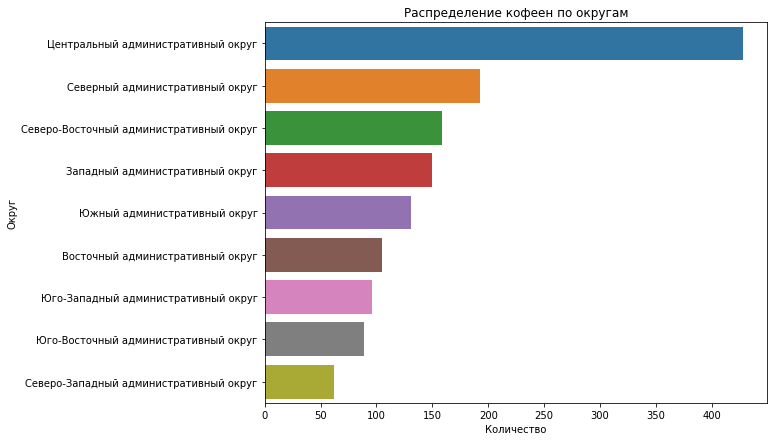

In [54]:
x = cafe.groupby('district')['name'].count().sort_values(ascending=False)
y = cafe.groupby('district')['name'].count().sort_values(ascending=False).index

fig = plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=cafe.reset_index())

plt.title('Распределение кофеен по округам')
plt.xlabel('Количество')
plt.ylabel('Округ')

plt.show()

In [55]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

data = cafe.groupby('district')['name'].count()

folium.Choropleth(
    geo_data=geo_json,
    data=data,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.4,
    legend_name='Концентрация кофеен по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

cafe.apply(create_clusters, axis=1)

m

**Вывод:** В ЦАО больше, чем в 2 раза больше кофеен, чем в любом другом округе. Меньше всего в СЗАО, ЮВАО, ЮЗАО.
Количество кофеен уменьшается с удалением от центра.

### Круглосуточные кофейни

In [56]:
print('Доля круглосуточных кофеен:', round(len(cafe[cafe['is_24/7'] == 1]) / len(cafe),2))

Доля круглосуточных кофеен: 0.04


### Рейтинги кофеен. Распределение по районам

In [57]:
cafe.groupby('district_red')['rating'].mean().sort_values(ascending=False)


district_red
Центральный         4.336449
Северо-Западный     4.325806
Северный            4.291710
Юго-Западный        4.283333
Восточный           4.282857
Южный               4.232824
Юго-Восточный       4.225843
Северо-Восточный    4.216981
Западный            4.195333
Name: rating, dtype: float64

In [58]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

data = cafe.groupby('district')['rating'].mean()

folium.Choropleth(
    geo_data=geo_json,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

cafe.apply(create_clusters, axis=1)

m

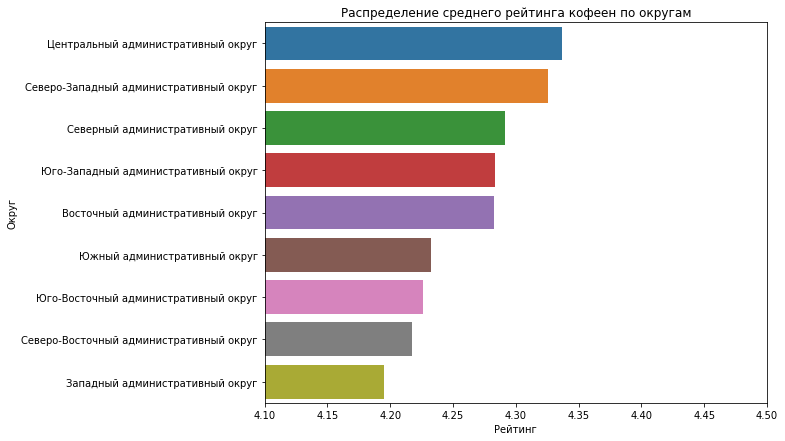

In [59]:
x = cafe.groupby('district')['rating'].mean().sort_values(ascending=False)
y = cafe.groupby('district')['rating'].mean().sort_values(ascending=False).index

fig = plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=cafe.reset_index())
plt.xlim(4.1, 4.5)

plt.title('Распределение среднего рейтинга кофеен по округам')
plt.xlabel('Рейтинг')
plt.ylabel('Округ')

plt.show()

**Вывод:** Наиболее высокий средний рейтинг у кофеен расположенных в ЦАО , СЗАО и САО.

### Средняя стоимость чашки капучино

In [60]:
dist_chain_coffee_price = cafe[cafe['middle_coffee_cup'] < np.quantile(cafe[~cafe['middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.99)].groupby(['district_red', 'chain'],as_index=False)[
    'middle_coffee_cup'].mean()

In [61]:
dist_chain_coffee_price


,district_red,chain,middle_coffee_cup
0,Восточный,0,137.115385
1,Восточный,1,145.066667
2,Западный,0,196.600000
3,Западный,1,187.000000
4,Северный,0,170.619048
5,Северный,1,149.812500
6,Северо-Восточный,0,165.307692
7,Северо-Восточный,1,165.352941
8,Северо-Западный,0,161.777778
9,Северо-Западный,1,168.333333


In [62]:
name0='Не сетевая'
name1='Сетевая'
x=list(dist_chain_coffee_price['district_red'].unique())
y0=list(dist_chain_coffee_price[dist_chain_coffee_price['chain'] == 0][
    'middle_coffee_cup'])
y1=list(dist_chain_coffee_price[dist_chain_coffee_price['chain'] == 1][
    'middle_coffee_cup'])

fig = go.Figure(data=[
    go.Bar(name=name0, x=x, y=y0),
    go.Bar(name=name1, x=x, y=y1)
])

fig.update_layout(title='Средняя стоимость чашки капучино по кофейням', 
                  barmode='group', 
                  xaxis={'categoryorder':'total descending'})
fig.show()

In [63]:
print('Средняя стоимость чашки капучино', round(cafe[cafe[
    'middle_coffee_cup'] < np.quantile(cafe[~cafe[
    'middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.99)][
    'middle_coffee_cup'].mean(),1), 'р.')

Средняя стоимость чашки капучино 170.8 р.


In [64]:

print('Средняя стоимость чашки капучино в несетевой кофейне', round(
    dist_chain_coffee_price[dist_chain_coffee_price['chain'] == 0][
        'middle_coffee_cup'].mean(),1), 'р.')

print('Средняя стоимость чашки капучино в сетевой кофейне', round(
    dist_chain_coffee_price[dist_chain_coffee_price['chain'] == 1][
        'middle_coffee_cup'].mean(),1), 'р.')

Средняя стоимость чашки капучино в несетевой кофейне 170.4 р.
Средняя стоимость чашки капучино в сетевой кофейне 162.1 р.


**Вывод:** В несетевых кофейнях средняя стоимость чашки капучино дороже, кроме СЗАО, ЮВАО, ВАО, в среднем на 8.3 р.

# Рекомендации

- Рынок кофеен в Москве высококонкурентен, но при этом востребован потребителями и тренд "латте take away" продолжает оставаться актуальным и стаканчик кофе по пути на учебу/работу является неотъемлемым атрибутом современных москвичей. 

- Стоит отметить, что рекомендуется открывать круглосуточную кофейню, т.к. их доля очень мала - всего 4%, а как известно Moscow never sleep.

- Рекомендуемое число посадочных мест - 80, что соответствует медианному значению по данной категории заведений.

- Меньше всего кофеен в СЗАО, ЮВАО, ЮЗАО, что можно учесть при открытие. Также эти районы не выделяются высоким рейтингом кофеен. Наиболее высокий средний рейтинг у кофеен расположенных в ЦАО, СЗАО и САО.

- В несетевых кофейнях средняя стоимость чашки капучино дороже, кроме СЗАО, ЮВАО, ВАО, в среднем на 8.3 р. Можно предположить, что сетевые заведения таким образом привлекают больше клиентов и их бизнес-модель смотрится интереснее для инвесторов. Поэтому следует стремиться к сетевому распространению заведения в перспективе. 

# Презентация

Презентация: <https://disk.yandex.ru/i/P1MoLdQb_wpcdQ>

Обновленная презентация: <https://disk.yandex.ru/i/YSamiA7jIXdq6g>

Презентация V.3: https://disk.yandex.ru/i/R9S5VZrjVsCSGg